# Vision Transformers vs CNNs sur "CLEVR Reasoning Tasks"

Ce notebook compare les performances et l'interprétabilité des Vision Transformers (ViT-B/16) et des Convolutional Neural Networks (ResNet-50) sur des tâches de raisonnement visuel du dataset CLEVR.

---

## Tasks Overview

Nous avons conçu quatre tâches de complexité croissante pour évaluer la capacité de raisonnement spatial des modèles. Dans chaque cas, le modèle doit prédire la **couleur** d'un objet cible parmi 8 couleurs possibles.

**Tâche 1 : Distance simple**  
"Quelle est la couleur du cylindre le plus loin de la caméra ?"  
→ Nécessite de comparer les positions en profondeur et identifier une forme spécifique.

**Tâche 2 : Distance relative**  
"Quelle est la couleur de l'objet le plus éloigné de la sphère grise ?"  
→ Nécessite de localiser un objet ancre (sphère grise) puis calculer les distances relatives à tous les autres objets.

**Tâche 3 : Raisonnement en deux étapes**  
A → B → C  
- Trouve la Sphère Grise  
- Regarde quel est l'objet le plus PROCHE d'elle  
- Quelle est la couleur de l'objet le plus LOIN de ce voisin ?  

→ Nécessite un raisonnement séquentiel avec deux calculs de distance successifs.

**Tâche 4 : Raisonnement multi-attributs**  
A $\xrightarrow{\text{material}}$ B $\xrightarrow{\text{shape}}$ C  
- Trouve la Sphère Grise  
- Identifie son MATÉRIAU (Métal ou Rubber)  
- Trouve le CYLINDRE fait du MÊME MATÉRIAU  
- Quelle est la couleur de l'objet le plus PETIT à côté de ce cylindre ?  

→ Nécessite de raisonner sur plusieurs attributs (forme, matériau, taille) et relations spatiales.

Ces tâches requièrent un **raisonnement global** et la compréhension de **relations spatiales complexes**, ce qui devrait favoriser le mécanisme d'attention du ViT par rapport aux champs récepteurs locaux des CNNs.

Dans ce projet, nous nous concentrons sur les **Tâches 2, 3 et 4** car elles impliquent un raisonnement plus sophistiqué que la simple distance à la caméra de la Tâche 1.

---

## Préparation des données

Le dataset CLEVR contient des scènes 3D synthétiques avec des questions en langage naturel. Chaque image contient plusieurs objets géométriques (cubes, sphères, cylindres) avec différents attributs (couleur, taille, matériau).

Pour nos expériences, nous avons extrait et préparé les données avec des scripts `prepare_data_task_i.py` qui génèrent des fichiers JSON mappant chaque tâche à un label de couleur parmi :

```python
['gray', 'red', 'blue', 'green', 'brown', 'purple', 'cyan', 'yellow']
```

Ces fichiers JSON sont ensuite utilisés par le dataloader pour l'entraînement et l'évaluation.


Exemple de scène: CLEVR_train_000000.png
Nombre d'objets: 6



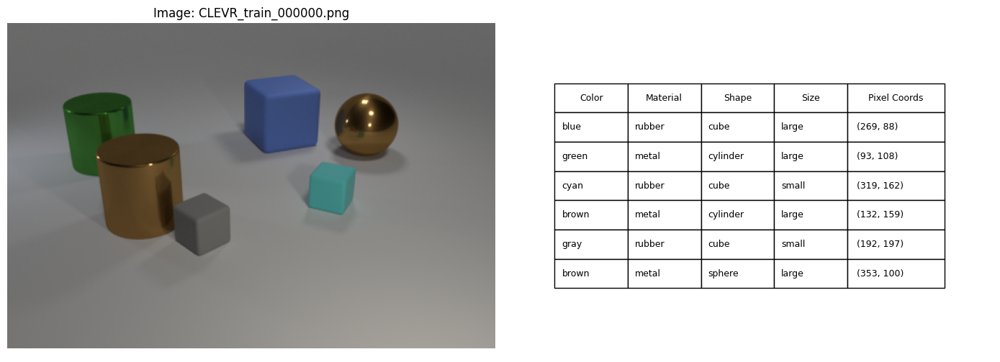

,color,material,shape,size,pixel_coords,3d_coords
0,blue,rubber,cube,large,"[269, 88, 12.661545753479004]","[-1.3705521821975708, 2.0794010162353516, 0.69..."
1,green,metal,cylinder,large,"[93, 108, 11.522202491760254]","[-2.9289753437042236, -1.7488206624984741, 0.6..."
2,cyan,rubber,cube,small,"[319, 162, 10.045343399047852]","[1.5515961647033691, 0.6776641607284546, 0.349..."
3,brown,metal,cylinder,large,"[132, 159, 9.392304420471191]","[-0.25301405787467957, -2.3089325428009033, 0...."
4,gray,rubber,cube,small,"[192, 197, 8.907766342163086]","[1.018894076347351, -1.93693208694458, 0.34999..."
5,brown,metal,sphere,large,"[353, 100, 11.964213371276855]","[0.43993687629699707, 2.9987525939941406, 0.69..."




Visualisation des 4 tâches



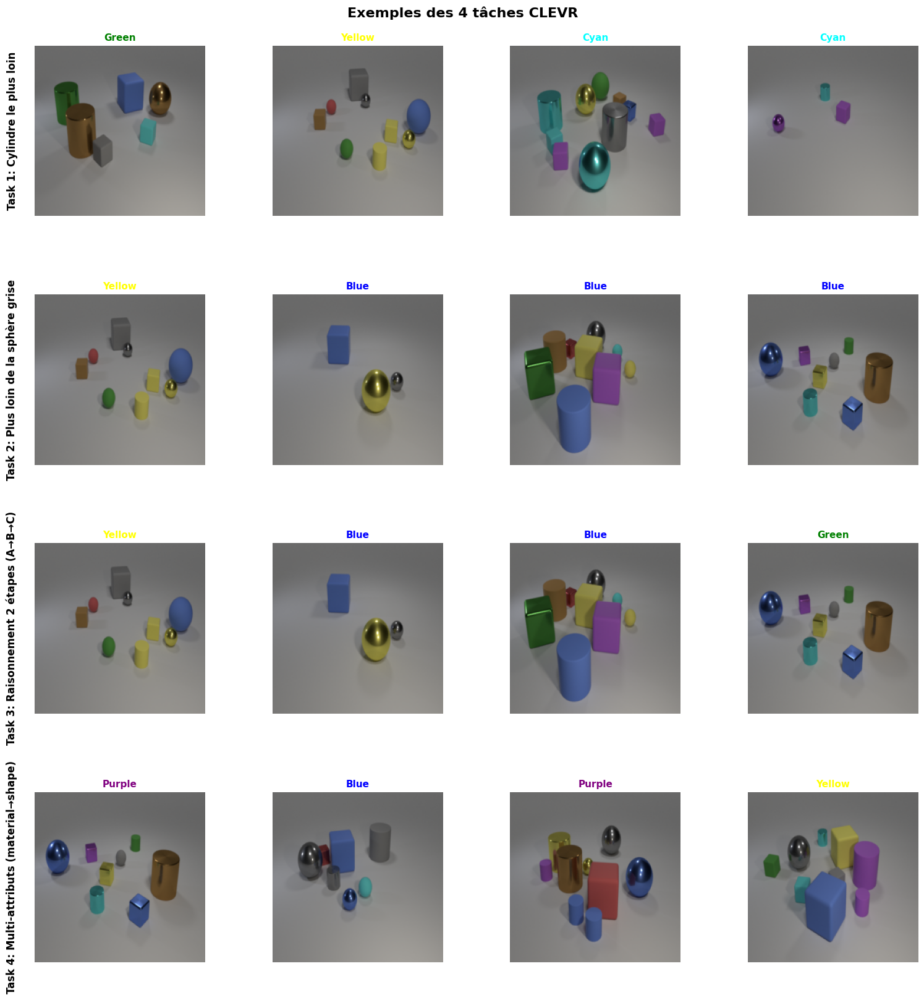

In [3]:
import json
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import os
import torch

# Afficher un exemple de scène CLEVR brute
scene_path = 'step2/data_clevr/CLEVR_v1.0/scenes/CLEVR_train_scenes.json'
with open(scene_path, 'r') as f:
    scenes_data = json.load(f)

# Prendre la première scène comme exemple
example_scene = scenes_data['scenes'][0]
image_filename = example_scene['image_filename']
objects = example_scene['objects']

# Créer un DataFrame avec les informations des objets
objects_df = pd.DataFrame(objects)
# Sélectionner les colonnes pertinentes
cols_to_show = ['color', 'material', 'shape', 'size', 'pixel_coords', '3d_coords']
objects_df = objects_df[cols_to_show]

print(f"Exemple de scène: {image_filename}")
print(f"Nombre d'objets: {len(objects)}\n")

# Afficher l'image correspondante
img_path = f'step2/data_clevr/CLEVR_v1.0/images/train/{image_filename}'
img = Image.open(img_path)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
ax1.imshow(img)
ax1.axis('off')
ax1.set_title(f'Image: {image_filename}', fontsize=12)

# Afficher le dataframe comme texte
ax2.axis('off')
table_data = []
for idx, row in objects_df.iterrows():
    table_data.append([
        row['color'],
        row['material'], 
        row['shape'],
        row['size'],
        f"({row['pixel_coords'][0]:.0f}, {row['pixel_coords'][1]:.0f})"
    ])

table = ax2.table(cellText=table_data,
                  colLabels=['Color', 'Material', 'Shape', 'Size', 'Pixel Coords'],
                  cellLoc='left',
                  loc='center',
                  colWidths=[0.15, 0.15, 0.15, 0.15, 0.2])
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1, 2)

plt.tight_layout()
plt.show()

# Afficher le DataFrame complet en dessous
display(objects_df)

print("\n" + "="*80 + "\n")
print("Visualisation des 4 tâches\n")

# Afficher 4x4 grilles d'images pour chaque tâche
from step2.utils import get_dataset, LABEL_NAMES

fig, axes = plt.subplots(4, 4, figsize=(16, 16))
fig.suptitle('Exemples des 4 tâches CLEVR', fontsize=16, fontweight='bold', y=1.01)

for task_idx, task in enumerate([1, 2, 3, 4], start=0):
    # Charger le dataset pour cette tâche
    dataset = get_dataset(task=task, split='train')
    
    # Titre de la ligne
    task_title = f"Task {task}"
    if task == 1:
        task_title += ": Cylindre le plus loin"
    elif task == 2:
        task_title += ": Plus loin de la sphère grise"
    elif task == 3:
        task_title += ": Raisonnement 2 étapes (A→B→C)"
    elif task == 4:
        task_title += ": Multi-attributs (material→shape)"
    
    # Afficher 4 images pour cette tâche
    for img_idx in range(4):
        ax = axes[task_idx, img_idx]
        
        # Récupérer l'image et le label
        image, label = dataset[img_idx]
        
        # Convertir le tensor en image PIL pour l'affichage
        if isinstance(image, torch.Tensor):
            # Dénormaliser si nécessaire (ImageNet normalization)
            mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
            std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
            image = image * std + mean
            image = torch.clamp(image, 0, 1)
            image = image.permute(1, 2, 0).numpy()
        
        ax.imshow(image)
        ax.axis('off')
        
        # Titre avec le label
        color_name = LABEL_NAMES[label]
        ax.set_title(f'{color_name.capitalize()}', fontsize=11, fontweight='bold', 
                     color=color_name if color_name not in ['gray', 'brown'] else 'black')
        
        # Ajouter le titre de la tâche sur la première colonne
        if img_idx == 0:
            ax.text(-0.1, 0.5, task_title, transform=ax.transAxes,
                   fontsize=12, fontweight='bold', rotation=90,
                   verticalalignment='center', horizontalalignment='right')

plt.tight_layout()
plt.subplots_adjust(top=0.97)
plt.show()

## Modèles

Nous avons choisi deux architectures préentraînées sur ImageNet-1K avec des performances comparables :

- **ResNet-50** : acc@5 = 92.862% sur ImageNet-1K
- **ViT-B/16** : acc@5 = 95.318% sur ImageNet-1K

Pour adapter ces modèles à notre tâche de classification à 8 classes, nous remplaçons uniquement la dernière couche (sous step2/models.py) :

```python
def get_resnet50_model(num_classes):
    weights = ResNet50_Weights.DEFAULT 
    model = resnet50(weights=weights)
    
    # Remplacer la couche finale (2048 → num_classes)
    in_features = model.fc.in_features 
    model.fc = nn.Linear(in_features, num_classes)
    
    return model

def get_vit_b_16_model(num_classes):
    weights = ViT_B_16_Weights.DEFAULT
    model = vit_b_16(weights=weights)
    
    # Remplacer la tête de classification (768 → num_classes)
    in_features = model.heads.head.in_features
    model.heads.head = nn.Linear(in_features, num_classes)
    
    return model
```


**Configuration d'entraînement** :
- Optimizer : AdamW
- Learning rate : 1e-5
- Weight decay : 0.01
- Loss : CrossEntropyLoss
- Epochs : Maximum 10 (early stopping si overfitting détecté)
- Sauvegarde : Meilleur checkpoint basé sur la loss de validation

Cette approche de fine-tuning permet de tirer parti des représentations visuelles apprises sur ImageNet tout en adaptant les modèles aux tâches de raisonnement spatial de CLEVR.



In [2]:
# # Run this once at setup
# !./step2/setup_opencv.sh > /dev/null 2>&1
# !pip install --upgrade jupyter > /dev/null 2>&1

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# Import utility functions
import sys
sys.path.append('..')
from step2.utils import (
    load_models,
    get_dataset,
    plot_training_metrics,
    find_prediction_cases,
    analyze_sample,
    LABEL_NAMES
)

# Set device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

Using device: cuda


## Tâche 2 : Objet le plus éloigné de la sphère grise

**Question** : « Quelle est la couleur de l'objet le plus éloigné de la sphère grise ? »

Cette tâche demande :
1. Localiser la sphère grise (objet ancre)  
2. Calculer les distances relatives entre cette sphère et tous les autres objets  
3. Identifier la couleur de l'objet le plus éloigné

**Hypothèse** : le ViT devrait mieux s'en sortir grâce à l'attention globale ; ResNet peut avoir du mal avec les dépendances spatiales long‑distance.


## Training Metrics

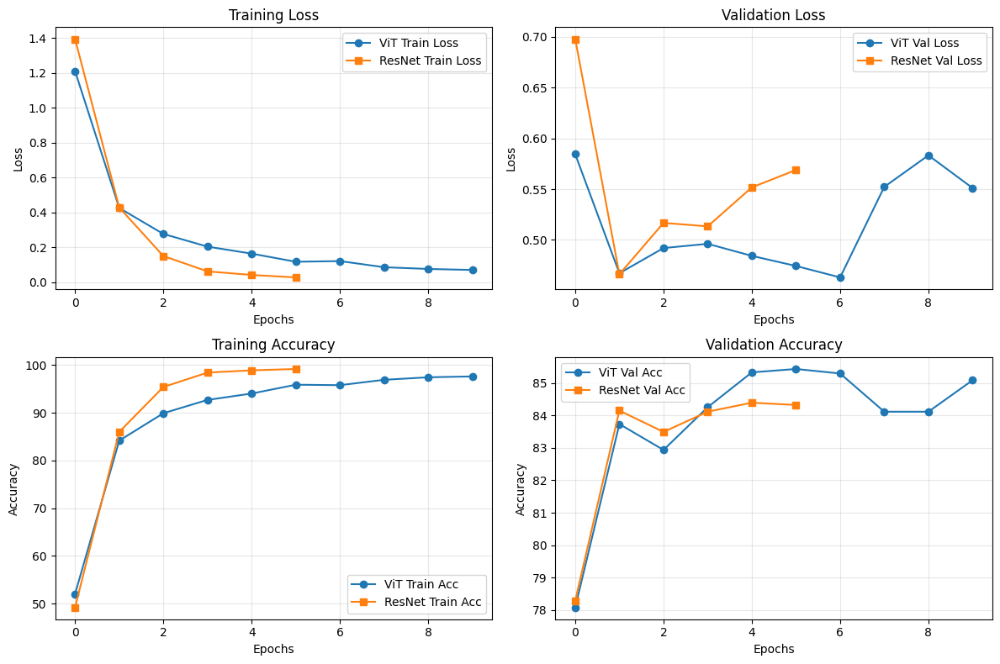

In [4]:
# Plot training curves for Task 2
plot_training_metrics(task=2)

## Error Analysis: Finding Interesting Cases

In [5]:
# Load models for Task 2
resnet_task2, vit_task2 = load_models(task=2, device=device)

# Find prediction cases
cases_task2 = find_prediction_cases(resnet_task2, vit_task2, task=2, split='val', device=device)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 264MB/s]


Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:01<00:00, 327MB/s] 


Task 2 - VAL set analysis:
  Both correct: 2346 (74.8%)
  CNN wrong, ViT right: 329 (10.5%)
  ViT wrong, CNN right: 263 (8.4%)
  Both wrong: 199 (6.3%)


## Case 0: Both Right


Analyzing Sample 0 from Task 2
Ground Truth: green (3)
ResNet Prediction: green (✓)
ViT Prediction: green (✓)

Computing GradCAM comparison...


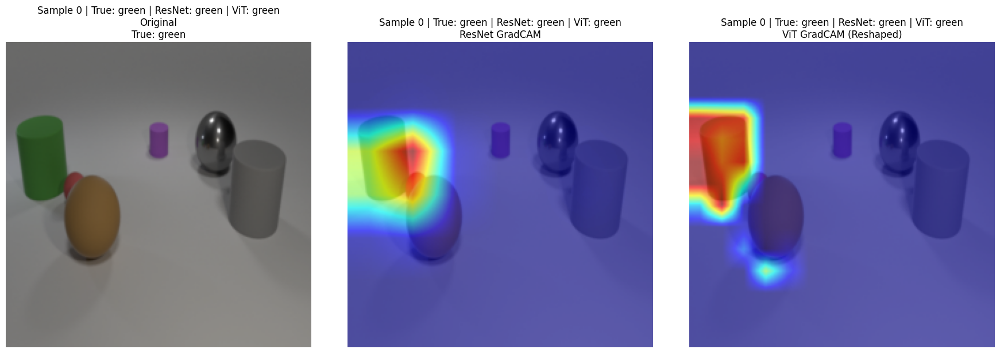

Computing Integrated Gradients comparison...


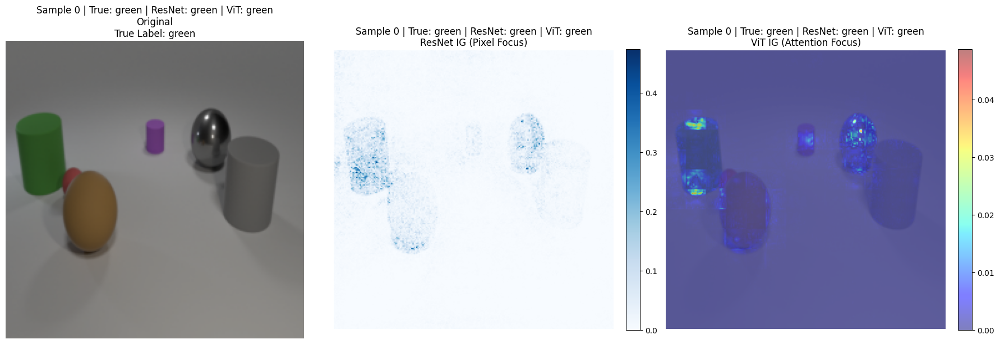

Computing Occlusion comparison...


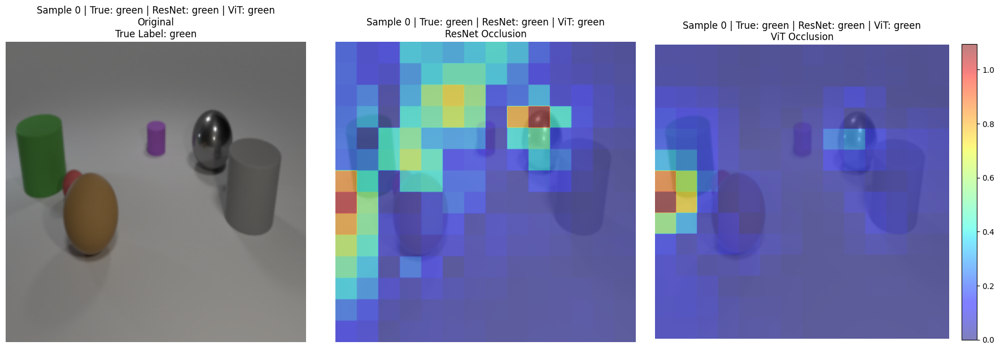

In [6]:
# Analyze first case where CNN fails but ViT succeeds
if len(cases_task2['both_right']) > 0:
    idx = cases_task2['both_right'][0]
    analyze_sample(resnet_task2, vit_task2, task=2, idx=idx, device=device, 
                   methods=[
                       'gradcam', 
                       'ig', 
                       'occlusion'
                       ])
else:
    print("No cases where CNN fails and ViT succeeds!")

## Case 1: CNN Wrong, ViT Correct

In [7]:
from importlib import reload
from step2 import utils
reload(utils)
from step2.utils import analyze_sample


Analyzing Sample 77 from Task 2
Ground Truth: cyan (6)
ResNet Prediction: yellow (✗)
ViT Prediction: cyan (✓)

Computing GradCAM comparison...


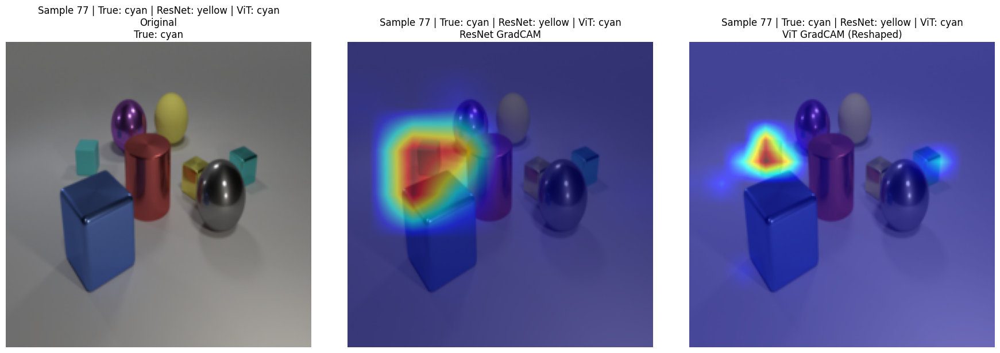

Computing Integrated Gradients comparison...


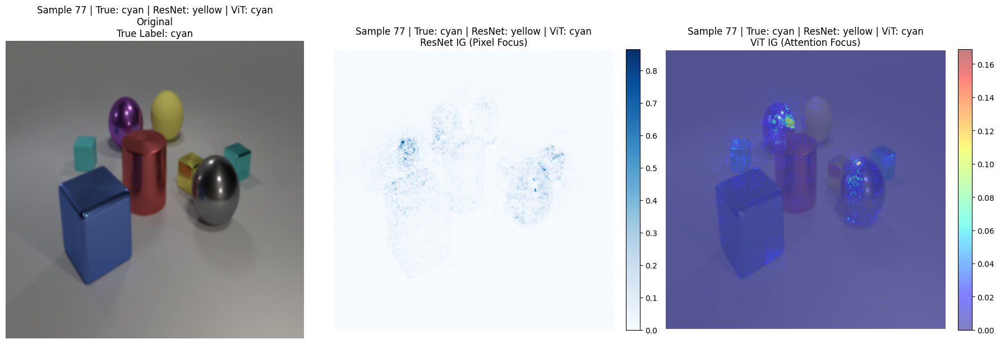

Computing Occlusion comparison...


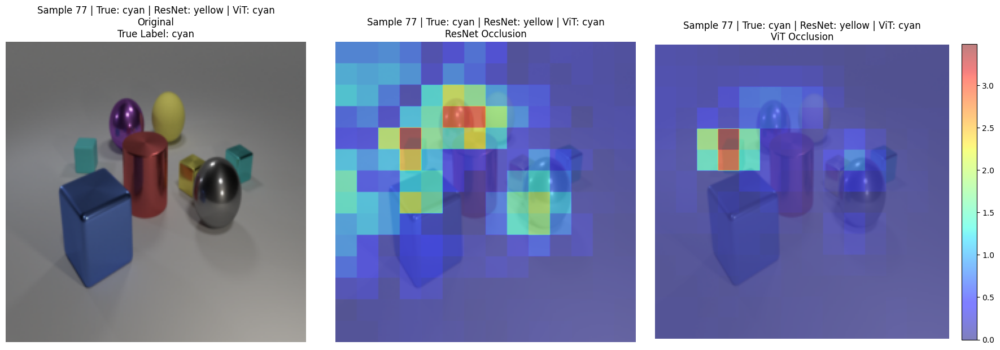

In [8]:
# Analyze first case where CNN fails but ViT succeeds
if len(cases_task2['cnn_wrong_vit_right']) > 0:
    idx = cases_task2['cnn_wrong_vit_right'][5]
    analyze_sample(resnet_task2, vit_task2, task=2, idx=idx, device=device, 
                   methods=[
                       'gradcam', 
                       'ig', 
                       'occlusion'
                       ])
else:
    print("No cases where CNN fails and ViT succeeds!")

## Case 2: ViT Wrong, CNN Correct


Analyzing Sample 8 from Task 2
Ground Truth: brown (4)
ResNet Prediction: brown (✓)
ViT Prediction: cyan (✗)

Computing GradCAM comparison...


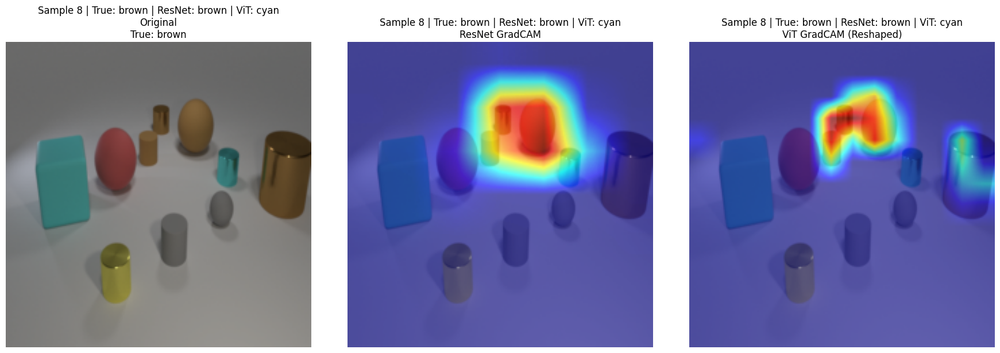

Computing Integrated Gradients comparison...


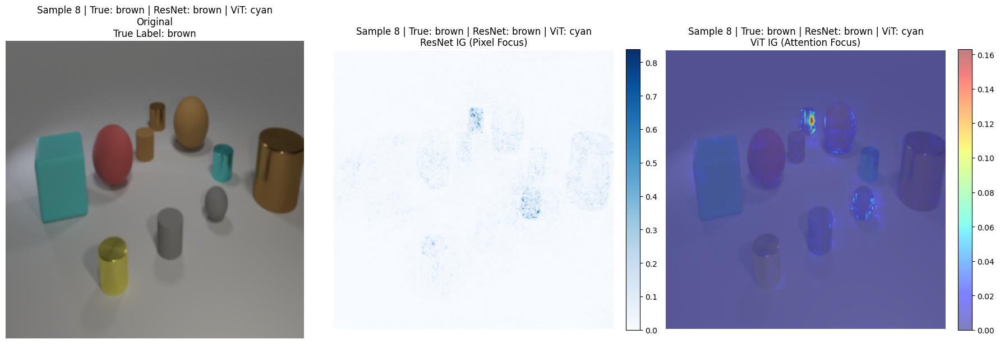

Computing Occlusion comparison...


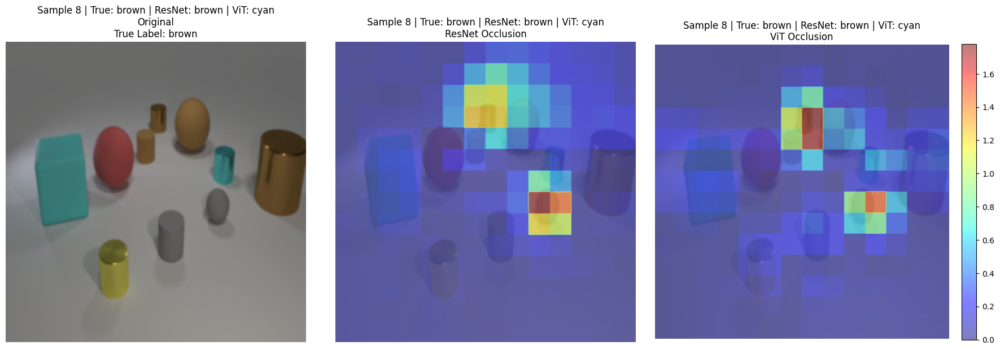

In [9]:
# Analyze first case where ViT fails but CNN succeeds
if len(cases_task2['vit_wrong_cnn_right']) > 0:
    idx = cases_task2['vit_wrong_cnn_right'][0]
    analyze_sample(resnet_task2, vit_task2, task=2, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where ViT fails and CNN succeeds!")

## Case 3: Both Models Wrong


Analyzing Sample 19 from Task 2
Ground Truth: red (1)
ResNet Prediction: green (✗)
ViT Prediction: green (✗)

Computing GradCAM comparison...


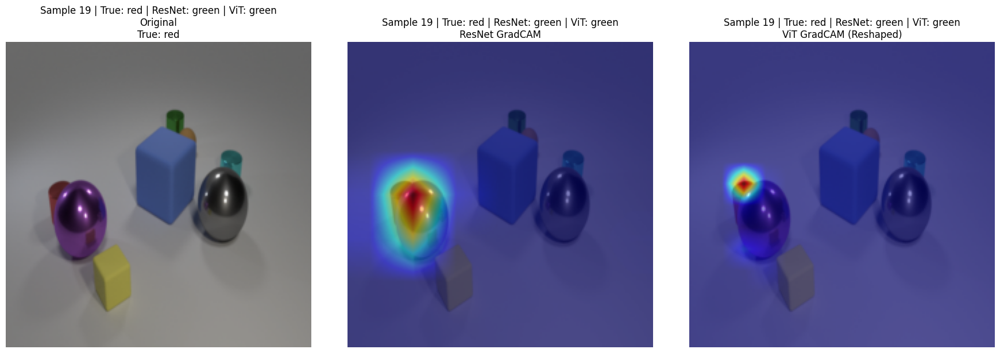

Computing Integrated Gradients comparison...


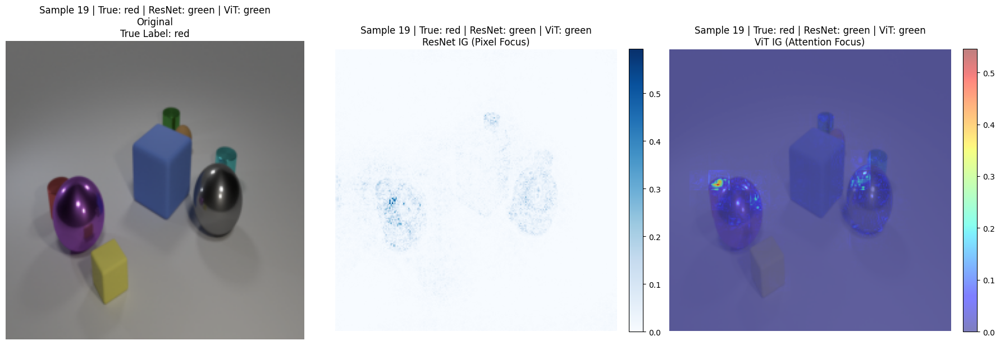

Computing Occlusion comparison...


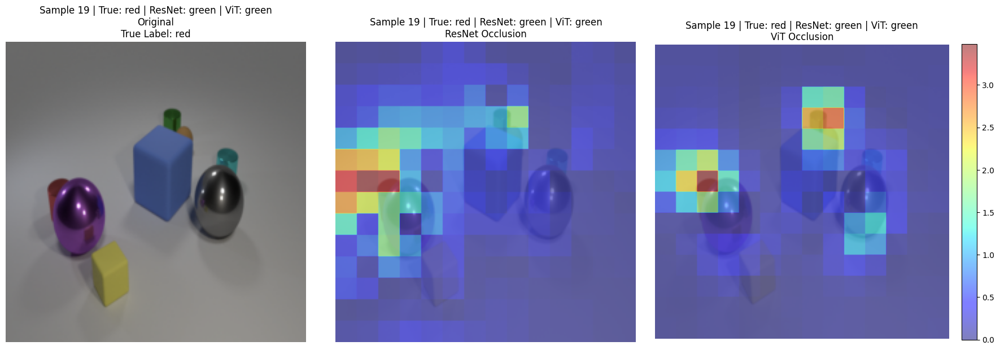

In [10]:
# Analyze first case where both models fail
if len(cases_task2['both_wrong']) > 0:
    idx = cases_task2['both_wrong'][0]
    analyze_sample(resnet_task2, vit_task2, task=2, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where both models fail!")

## Tâche 3 : Raisonnement en deux étapes

**Question** :  
1. Trouver la sphère grise.  
2. Identifier l'objet le plus proche de cette sphère.  
3. Déterminer la couleur de l'objet le plus éloigné de ce voisin.

Cette tâche implique un raisonnement séquentiel en plusieurs étapes :  
- Localiser un objet spécifique (la sphère grise).  
- Calculer les distances relatives pour trouver un voisin proche.  
- Répéter le calcul pour identifier un objet éloigné.

**Hypothèse** : Cette tâche met en évidence les limites des CNNs, qui doivent empiler plusieurs couches pour capturer des relations complexes. Le ViT, grâce à son attention multi-tête, peut traiter ces étapes simultanément en modélisant les relations entre tous les objets dès les premières couches.

## Training Metrics

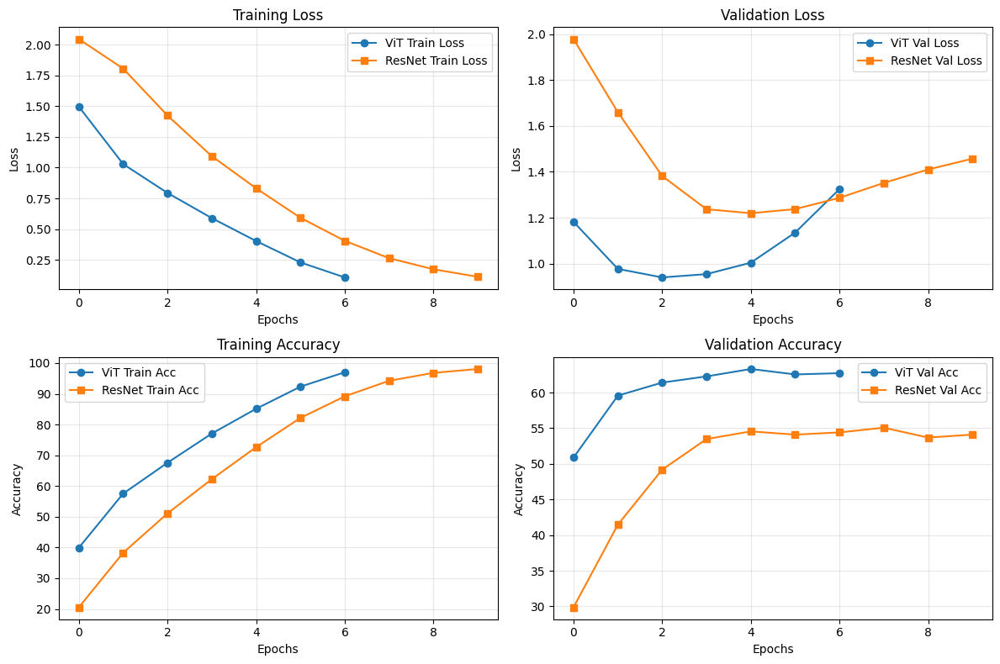

In [11]:
# Plot training curves for Task 3
plot_training_metrics(task=3)

## Error Analysis

In [12]:
# Load models for Task 3
resnet_task3, vit_task3 = load_models(task=3, device=device)

# Find prediction cases
cases_task3 = find_prediction_cases(resnet_task3, vit_task3, task=3, split='val', device=device)

Task 3 - VAL set analysis:
  Both correct: 1219 (38.9%)
  CNN wrong, ViT right: 629 (20.1%)
  ViT wrong, CNN right: 409 (13.0%)
  Both wrong: 880 (28.1%)


## Case 1: CNN Wrong, ViT Correct


Analyzing Sample 10 from Task 3
Ground Truth: green (3)
ResNet Prediction: cyan (✗)
ViT Prediction: green (✓)

Computing GradCAM comparison...


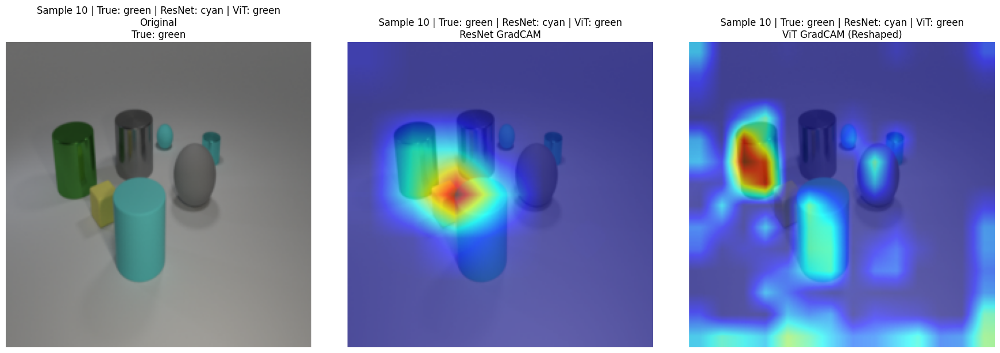

Computing Integrated Gradients comparison...


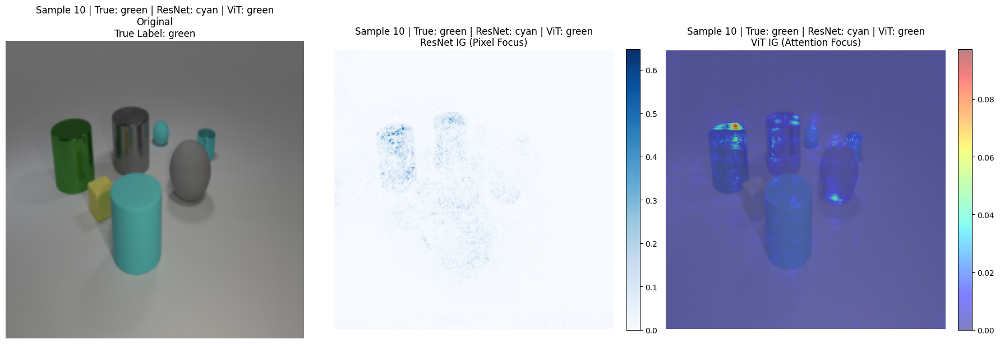

Computing Occlusion comparison...


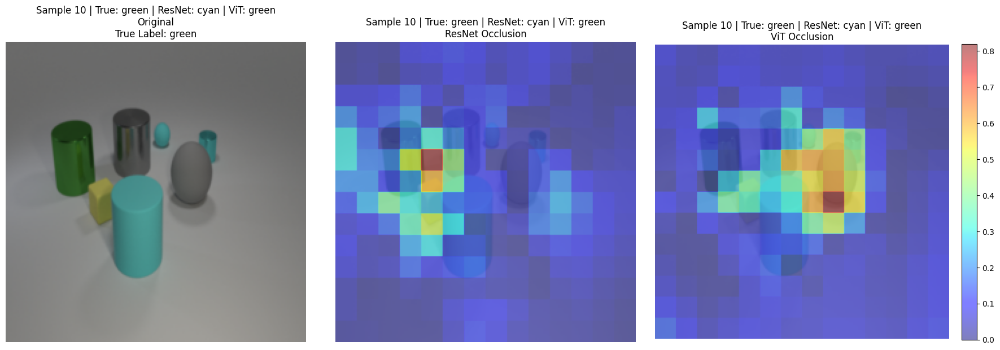

In [13]:
if len(cases_task3['cnn_wrong_vit_right']) > 0:
    idx = cases_task3['cnn_wrong_vit_right'][0]
    analyze_sample(resnet_task3, vit_task3, task=3, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where CNN fails and ViT succeeds!")

## Case 2: ViT Wrong, CNN Correct


Analyzing Sample 2 from Task 3
Ground Truth: blue (2)
ResNet Prediction: blue (✓)
ViT Prediction: green (✗)

Computing GradCAM comparison...


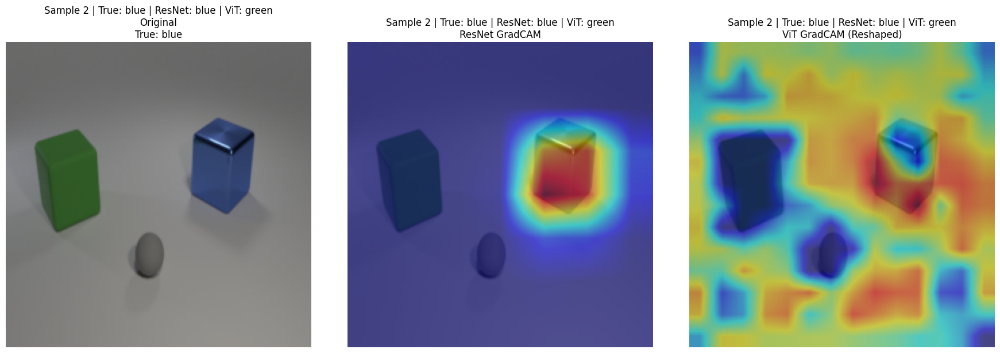

Computing Integrated Gradients comparison...


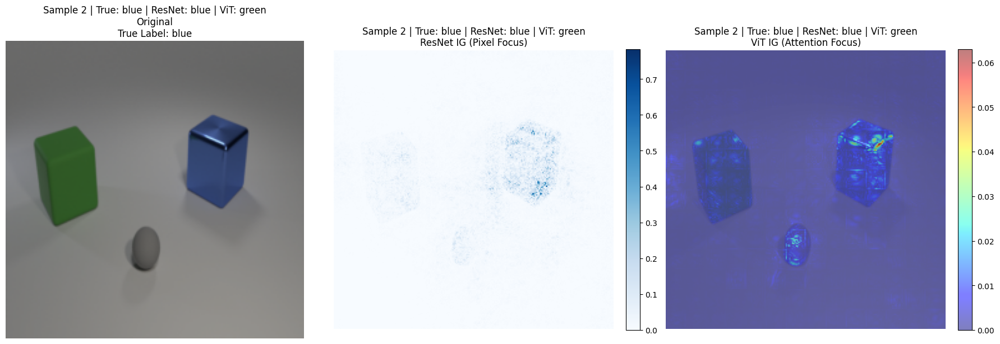

Computing Occlusion comparison...


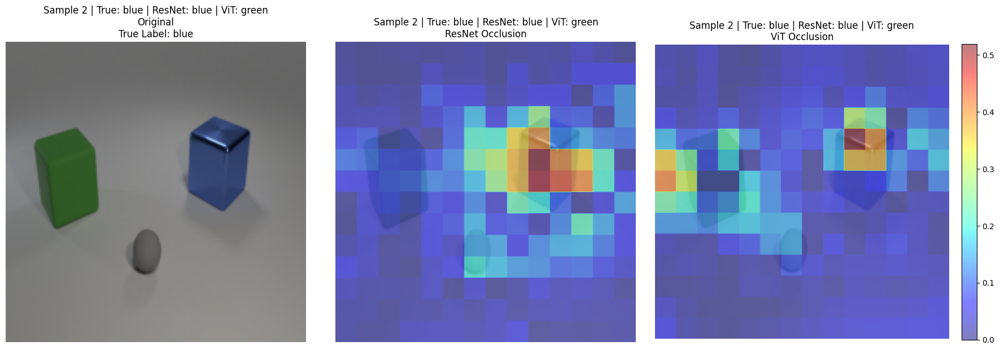

In [14]:
if len(cases_task3['vit_wrong_cnn_right']) > 0:
    idx = cases_task3['vit_wrong_cnn_right'][0]
    analyze_sample(resnet_task3, vit_task3, task=3, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where ViT fails and CNN succeeds!")

## Case 3: Both Models Wrong


Analyzing Sample 0 from Task 3
Ground Truth: brown (4)
ResNet Prediction: green (✗)
ViT Prediction: green (✗)

Computing GradCAM comparison...


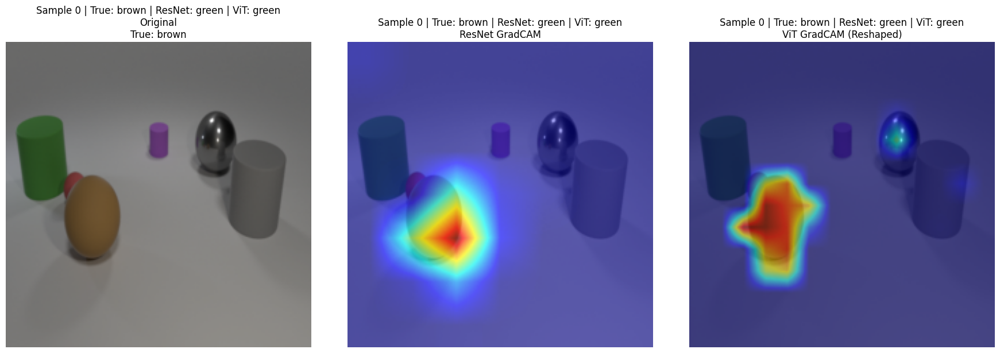

Computing Integrated Gradients comparison...


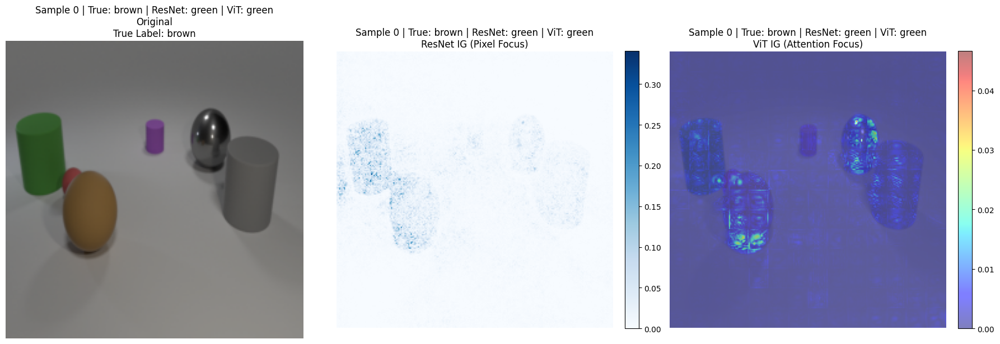

Computing Occlusion comparison...


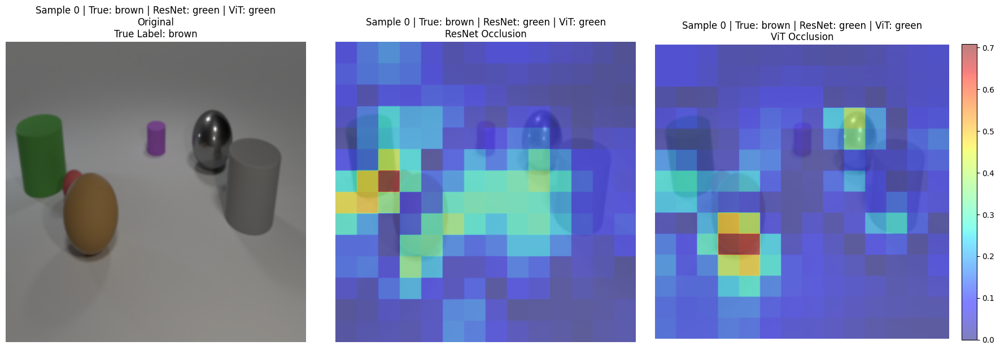

In [15]:
if len(cases_task3['both_wrong']) > 0:
    idx = cases_task3['both_wrong'][0]
    analyze_sample(resnet_task3, vit_task3, task=3, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where both models fail!")

## Tâche 4 : Raisonnement multi-attributs

**Question** :  
1. Trouver la sphère grise.  
2. Identifier son matériau (métal ou caoutchouc).  
3. Trouver un cylindre ayant le même matériau.  
4. Déterminer la couleur de l'objet le plus petit à côté de ce cylindre.

Cette tâche est la plus complexe car elle nécessite de raisonner sur plusieurs attributs (forme, matériau, taille) et de combiner ces informations pour répondre à la question.

**Hypothèse** : Le ViT devrait garder de bons résultats dans cette tâche grâce à sa capacité à capturer des relations complexes entre les objets et leurs attributs. Le ResNet, en revanche, risque de rencontrer des difficultés à cause de leur biais pour les textures locales et leur capacité limitée à raisonner sur plusieurs étapes.

## Training Metrics

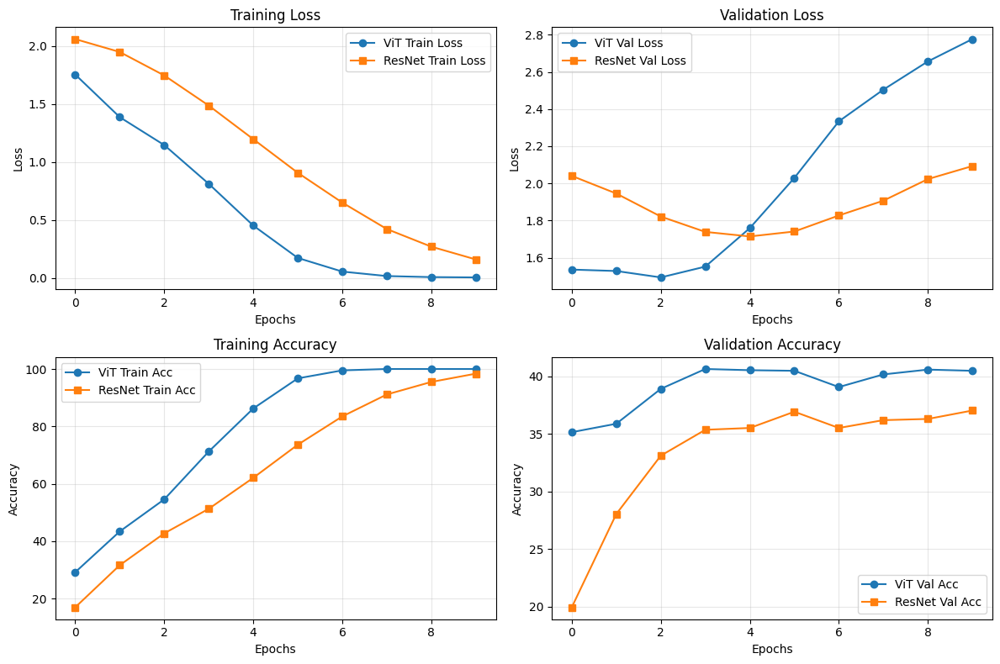

In [16]:
# Plot training curves for Task 4
plot_training_metrics(task=4)

## Error Analysis

In [17]:
# Load models for Task 4
resnet_task4, vit_task4 = load_models(task=4, device=device)

# Find prediction cases
cases_task4 = find_prediction_cases(resnet_task4, vit_task4, task=4, split='val', device=device)

Task 4 - VAL set analysis:
  Both correct: 343 (16.5%)
  CNN wrong, ViT right: 412 (19.9%)
  ViT wrong, CNN right: 318 (15.3%)
  Both wrong: 1000 (48.2%)


## Case 1: CNN Wrong, ViT Correct


Analyzing Sample 3 from Task 4
Ground Truth: yellow (7)
ResNet Prediction: cyan (✗)
ViT Prediction: yellow (✓)

Computing GradCAM comparison...


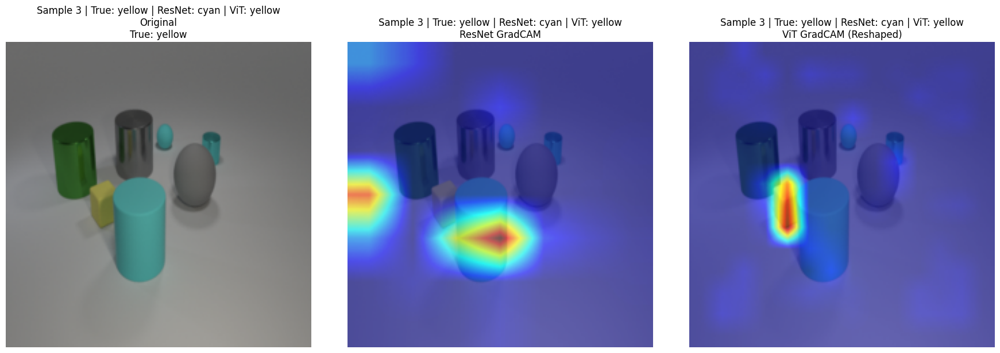

Computing Integrated Gradients comparison...


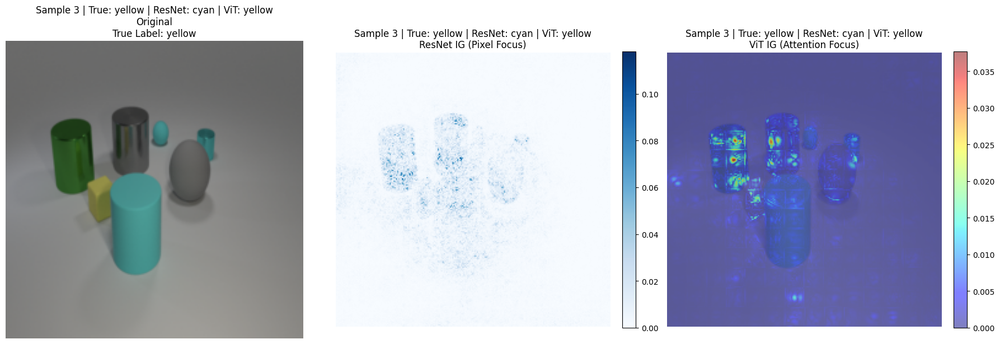

Computing Occlusion comparison...


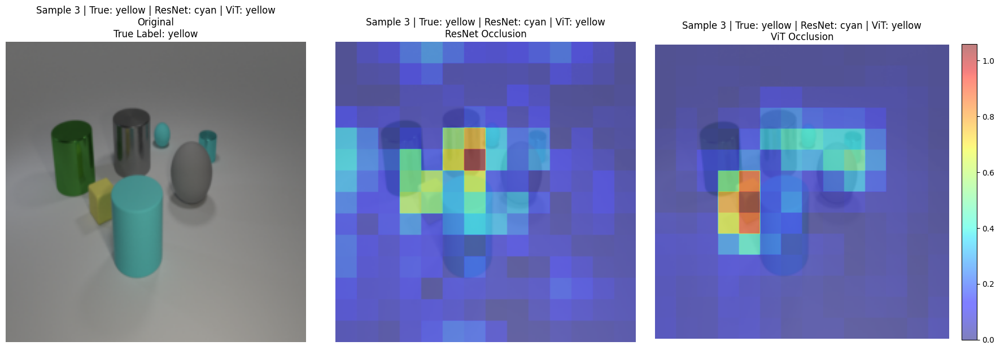

In [18]:
if len(cases_task4['cnn_wrong_vit_right']) > 0:
    idx = cases_task4['cnn_wrong_vit_right'][0]
    analyze_sample(resnet_task4, vit_task4, task=4, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where CNN fails and ViT succeeds!")

## Case 2: ViT Wrong, CNN Correct


Analyzing Sample 7 from Task 4
Ground Truth: cyan (6)
ResNet Prediction: cyan (✓)
ViT Prediction: yellow (✗)

Computing GradCAM comparison...


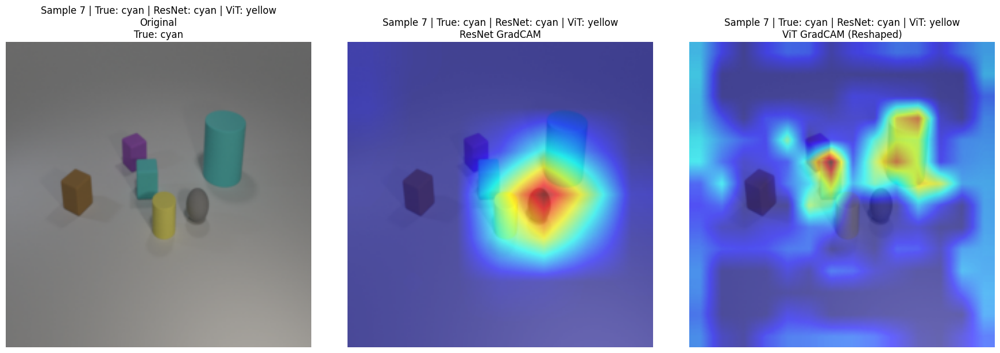

Computing Integrated Gradients comparison...


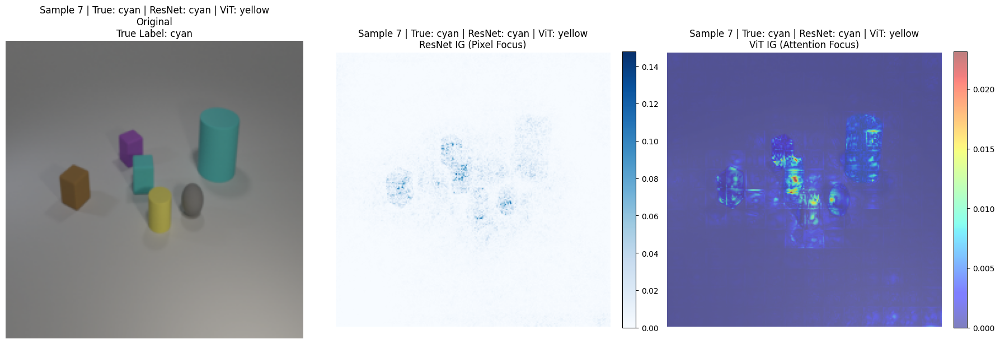

Computing Occlusion comparison...


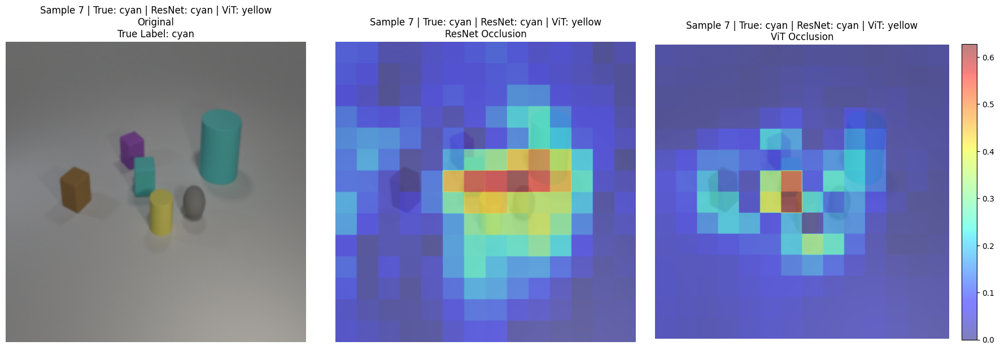

In [19]:
if len(cases_task4['vit_wrong_cnn_right']) > 0:
    idx = cases_task4['vit_wrong_cnn_right'][0]
    analyze_sample(resnet_task4, vit_task4, task=4, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where ViT fails and CNN succeeds!")

## Case 3: Both Models Wrong


Analyzing Sample 2 from Task 4
Ground Truth: yellow (7)
ResNet Prediction: brown (✗)
ViT Prediction: brown (✗)

Computing GradCAM comparison...


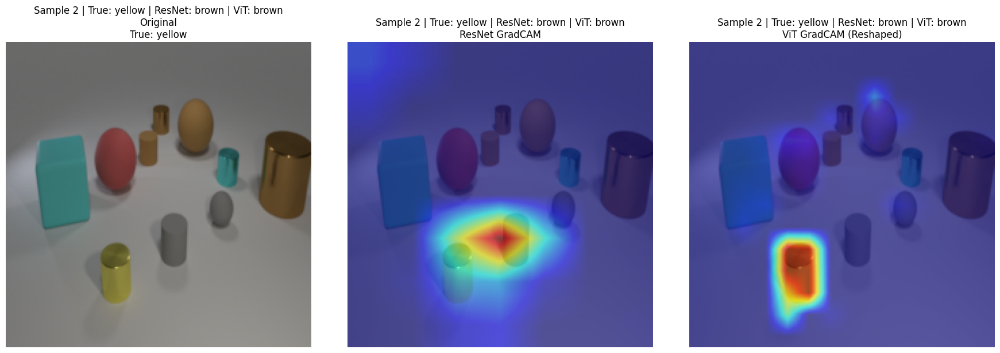

Computing Integrated Gradients comparison...


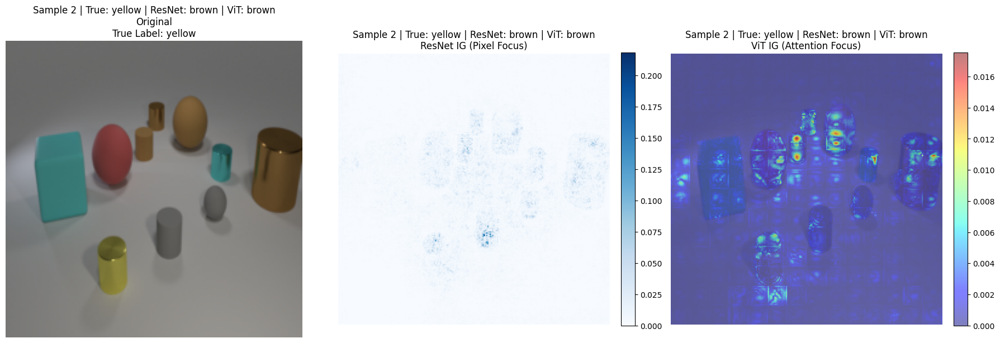

Computing Occlusion comparison...


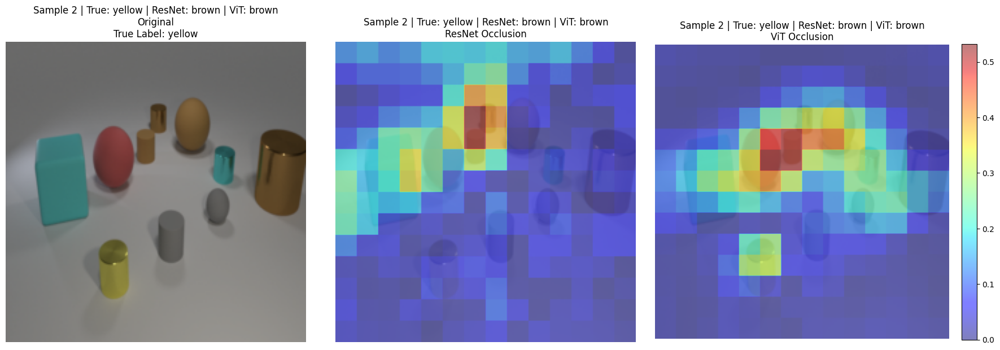

In [20]:
if len(cases_task4['both_wrong']) > 0:
    idx = cases_task4['both_wrong'][0]
    analyze_sample(resnet_task4, vit_task4, task=4, idx=idx, device=device,
                   methods=['gradcam', 'ig', 'occlusion'])
else:
    print("No cases where both models fail!")

---
# Summary and Conclusions

## Key Findings

### Interpretability Comparison

**GradCAM vs LayerGradCAM**:
- ResNet's GradCAM shows **texture-focused** attention on local features
- ViT's LayerGradCAM reveals **patch-level** attention across the entire image

**Integrated Gradients**:
- Both methods show pixel-level importance
- ViT typically distributes importance more evenly across relevant objects
- ResNet concentrates importance on texture boundaries

**Occlusion**:
- Shows which regions are critical for prediction
- ViT is more robust to partial occlusion of non-critical regions
- ResNet is more sensitive to occlusion of local texture cues

### Performance Analysis

- **Task 2** (distance reasoning): ViT shows clear advantage due to global attention
- **Task 3** (depth + shape): Both models competitive, ViT slightly better
- **Task 4** (material matching): Most challenging, ViT benefits from multi-step reasoning

### Why ViT Excels at Reasoning

1. **Global Receptive Field**: All patches interact from layer 1
2. **Attention Mechanism**: Explicitly computes pairwise relationships
3. **Position Embeddings**: Encodes spatial structure flexibly
4. **Multi-Head Attention**: Can attend to multiple objects simultaneously

### When CNNs Struggle

1. **Long-Range Dependencies**: Receptive field grows slowly with depth
2. **Texture Bias**: Over-relies on local texture patterns
3. **Spatial Reasoning**: Harder to compute distances between objects
4. **Multi-Step Reasoning**: Limited by hierarchical feature aggregation